# 1 Problem Statement



The goal is to develop a predictive model that estimates individual insurance costs based on health, lifestyle, and demographic variables. This model will assist insurance companies in fairly pricing insurance policies, minimizing risk, and ensuring affordability for customers based on their risk profile.




# Data Overview

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
df = pd.read_csv('Data.csv')
df

,applicant_id,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,Occupation,visited_doctor_last_1_year,cholesterol_level,daily_avg_steps,age,heart_decs_history,...,smoking_status,Year_last_admitted,Location,weight,covered_by_any_other_company,Alcohol,exercise,weight_change_in_last_one_year,fat_percentage,insurance_cost
0,5000,3,1,1,Salried,2,125 to 150,4866,28,1,...,Unknown,NaN,Chennai,67,N,Rare,Moderate,1,25,20978
1,5001,0,0,0,Student,4,150 to 175,6411,50,0,...,formerly smoked,NaN,Jaipur,58,N,Rare,Moderate,3,27,6170
2,5002,1,0,0,Business,4,200 to 225,4509,68,0,...,formerly smoked,NaN,Jaipur,73,N,Daily,Extreme,0,32,28382
3,5003,7,4,0,Business,2,175 to 200,6214,51,0,...,Unknown,NaN,Chennai,71,Y,Rare,No,3,37,27148
4,5004,3,1,0,Student,2,150 to 175,4938,44,0,...,never smoked,2004.0,Bangalore,74,N,No,Extreme,0,34,29616
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,29995,3,0,0,Salried,4,225 to 250,5614,22,0,...,smokes,2000.0,Kanpur,79,Y,Rare,Moderate,4,40,39488
24996,29996,6,0,0,Business,4,200 to 225,4719,58,0,...,never smoked,2009.0,Kanpur,66,N,Rare,Moderate,2,28,14808
24997,29997,7,0,1,Student,2,150 to 175,5624,34,0,...,Unknown,NaN,Bhubaneswar,76,N,Rare,Moderate,1,35,33318
24998,29998,1,0,0,Salried,2,225 to 250,10777,27,0,...,Unknown,NaN,Surat,74,N,Rare,Moderate,0,40,30850


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   applicant_id                    25000 non-null  int64  
 1   years_of_insurance_with_us      25000 non-null  int64  
 2   regular_checkup_lasy_year       25000 non-null  int64  
 3   adventure_sports                25000 non-null  int64  
 4   Occupation                      25000 non-null  object 
 5   visited_doctor_last_1_year      25000 non-null  int64  
 6   cholesterol_level               25000 non-null  object 
 7   daily_avg_steps                 25000 non-null  int64  
 8   age                             25000 non-null  int64  
 9   heart_decs_history              25000 non-null  int64  
 10  other_major_decs_history        25000 non-null  int64  
 11  Gender                          25000 non-null  object 
 12  avg_glucose_level               

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
applicant_id,25000.0,17499.500000,7217.022701,5000.0,11249.75,17499.5,23749.25,29999.0
years_of_insurance_with_us,25000.0,4.089040,2.606612,0.0,2.00,4.0,6.00,8.0
regular_checkup_lasy_year,25000.0,0.773680,1.199449,0.0,0.00,0.0,1.00,5.0
adventure_sports,25000.0,0.081720,0.273943,0.0,0.00,0.0,0.00,1.0
visited_doctor_last_1_year,25000.0,3.104200,1.141663,0.0,2.00,3.0,4.00,12.0
daily_avg_steps,25000.0,5215.889320,1053.179748,2034.0,4543.00,5089.0,5730.00,11255.0
age,25000.0,44.918320,16.107492,16.0,31.00,45.0,59.00,74.0
heart_decs_history,25000.0,0.054640,0.227281,0.0,0.00,0.0,0.00,1.0
other_major_decs_history,25000.0,0.098160,0.297537,0.0,0.00,0.0,0.00,1.0
avg_glucose_level,25000.0,167.530000,62.729712,57.0,113.00,168.0,222.00,277.0


In [6]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

## Potential issues to check:

In [7]:
df.duplicated().sum()   

np.int64(0)

In [8]:
df.isnull().sum()/df.shape[0]*100

applicant_id                       0.000
years_of_insurance_with_us         0.000
regular_checkup_lasy_year          0.000
adventure_sports                   0.000
Occupation                         0.000
visited_doctor_last_1_year         0.000
cholesterol_level                  0.000
daily_avg_steps                    0.000
age                                0.000
heart_decs_history                 0.000
other_major_decs_history           0.000
Gender                             0.000
avg_glucose_level                  0.000
bmi                                3.960
smoking_status                     0.000
Year_last_admitted                47.524
Location                           0.000
weight                             0.000
covered_by_any_other_company       0.000
Alcohol                            0.000
exercise                           0.000
weight_change_in_last_one_year     0.000
fat_percentage                     0.000
insurance_cost                     0.000
dtype: float64

In [9]:
df.drop('Year_last_admitted',axis=1,inplace=True)
df.drop('applicant_id',axis=1,inplace=True)

In [10]:
# Define the renaming dictionary
rename_columns = {
    'regular_checkup_lasy_year': 'regular_checkups_last_year',
    'visited_doctor_last_1_year': 'doctor_visits_last_year',
    'heart_decs_history': 'heart_disease_history',
    'other_major_decs_history': 'other_major_disease_history',
    'daily_avg_steps': 'avg_daily_steps',
    'Year_last_admitted': 'last_admission_year',
    'covered_by_any_other_company': 'covered_by_other_company',
    'weight_change_in_last_one_year': 'weight_change_last_year'
}

# Rename the columns
df.rename(columns=rename_columns, inplace=True)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 22 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   years_of_insurance_with_us   25000 non-null  int64  
 1   regular_checkups_last_year   25000 non-null  int64  
 2   adventure_sports             25000 non-null  int64  
 3   Occupation                   25000 non-null  object 
 4   doctor_visits_last_year      25000 non-null  int64  
 5   cholesterol_level            25000 non-null  object 
 6   avg_daily_steps              25000 non-null  int64  
 7   age                          25000 non-null  int64  
 8   heart_disease_history        25000 non-null  int64  
 9   other_major_disease_history  25000 non-null  int64  
 10  Gender                       25000 non-null  object 
 11  avg_glucose_level            25000 non-null  int64  
 12  bmi                          24010 non-null  float64
 13  smoking_status  

### Variable Definitions

| **Variable**                         | **Business Definition**                                                                 |
|-------------------------------------|-----------------------------------------------------------------------------------------|
| `applicant_id`                      | Applicant unique ID                                                                    |
| `years_of_insurance_with_us`        | Number of years the customer has had a policy with the same company                    |
| `regular_checkup_lasy_year`         | Number of regular health checkups in the last one year                                 |
| `adventure_sports`                  | Involvement in adventure sports (e.g., climbing, diving)                               |
| `Occupation`                        | Occupation of the customer                                                             |
| `visited_doctor_last_1_year`        | Number of doctor visits in the last one year                                           |
| `cholesterol_level`                 | Customer’s cholesterol level at the time of applying for insurance                     |
| `daily_avg_steps`                   | Average daily steps taken by the customer                                              |
| `age`                               | Age of the customer                                                                    |
| `heart_decs_history`               | History of any past heart diseases                                                     |
| `other_major_decs_history`         | History of any major diseases or surgeries apart from heart-related issues             |
| `Gender`                            | Gender of the customer                                                                 |
| `avg_glucose_level`                 | Average glucose level while applying for insurance                                     |
| `bmi`                               | Body Mass Index of the customer at time of application                                 |
| `smoking_status`                    | Smoking status of the customer                                                         |
| `Year_last_admitted`               | Year the customer was last admitted to a hospital                                      |
| `Location`                          | Location of the hospital                                                               |
| `weight`                            | Weight of the customer                                                                 |
| `covered_by_any_other_company`      | Whether the customer is covered by any other insurance company                         |
| `Alcohol`                           | Alcohol consumption status of the customer                                             |
| `exercise`                          | Whether the customer exercises regularly                                               |
| `weight_change_in_last_one_year`    | Change in customer’s weight over the last one year                                     |
| `fat_percentage`                    | Body fat percentage at time of application                                             |
| `insurance_cost`                    | Total insurance cost                                                                   |


In [12]:
df['bmi'].isnull().sum()

np.int64(990)

In [13]:
df.shape

(25000, 22)

In [14]:
# Convert specified columns to 'category' dtype
cat_cols = ['adventure_sports', 'heart_disease_history', 'other_major_disease_history']
df[cat_cols] = df[cat_cols].astype('category')
num_cols = [x for x in df.columns if df[x].dtype in ['float64', 'int64']]
cat_cols = [x for x in df.columns if df[x].dtype in ['object','category']]
df[cat_cols] = df[cat_cols].astype('category')
print(num_cols)
cat_cols


['years_of_insurance_with_us', 'regular_checkups_last_year', 'doctor_visits_last_year', 'avg_daily_steps', 'age', 'avg_glucose_level', 'bmi', 'weight', 'weight_change_last_year', 'fat_percentage', 'insurance_cost']


['adventure_sports',
 'Occupation',
 'cholesterol_level',
 'heart_disease_history',
 'other_major_disease_history',
 'Gender',
 'smoking_status',
 'Location',
 'covered_by_other_company',
 'Alcohol',
 'exercise']

## 3 Exploratory Data Analysis

In [15]:
for col in cat_cols:
    print(df[col].value_counts(1)*100)

adventure_sports
0    91.828
1     8.172
Name: proportion, dtype: float64
Occupation
Student     40.676
Business    40.080
Salried     19.244
Name: proportion, dtype: float64
cholesterol_level
150 to 175    35.052
125 to 150    33.356
200 to 225    11.852
175 to 200    11.524
225 to 250     8.216
Name: proportion, dtype: float64
heart_disease_history
0    94.536
1     5.464
Name: proportion, dtype: float64
other_major_disease_history
0    90.184
1     9.816
Name: proportion, dtype: float64
Gender
Male      65.688
Female    34.312
Name: proportion, dtype: float64
smoking_status
never smoked       36.996
Unknown            30.220
formerly smoked    17.316
smokes             15.468
Name: proportion, dtype: float64
Location
Bangalore      6.968
Jaipur         6.824
Bhubaneswar    6.816
Mangalore      6.788
Delhi          6.720
Ahmedabad      6.708
Guwahati       6.688
Chennai        6.676
Kanpur         6.656
Nagpur         6.652
Mumbai         6.632
Lucknow        6.548
Pune           6.4

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from matplotlib.gridspec import GridSpec

def histogram_boxplot(data, feature, figsize=(16, 10), kde=False, bins='auto'):
    """
    Combined boxplot, histogram, and summary stats table with labeling logic based on bin count.
    """
    series = data[feature].dropna()
    stats = series.describe()
    q1, q2, q3 = stats['25%'], stats['50%'], stats['75%']
    iqr = q3 - q1
    lower_whisker = max(series.min(), q1 - 1.5 * iqr)
    upper_whisker = min(series.max(), q3 + 1.5 * iqr)
    mean = series.mean()
    skewness = series.skew()
    kurtosis = series.kurtosis()

    fig = plt.figure(figsize=figsize)
    gs = GridSpec(nrows=3, ncols=1, height_ratios=[0.3, 0.5, 0.2])

    # Boxplot
    ax_box = fig.add_subplot(gs[0])
    sns.boxplot(data=series.to_frame(), x=feature, ax=ax_box, color="magenta", showmeans=False)
    ax_box.plot(mean, 0, marker='^', color='green', markersize=10, label='Mean')
    ax_box.plot(q2, 0, marker='o', color='blue', markersize=8, label='Median')
    ax_box.text(mean, ax_box.get_ylim()[1] * 0.2, f'{mean:.2f}', fontsize=14, color='green')
    ax_box.text(q2, ax_box.get_ylim()[1] * -0.2, f'{q2:.2f}',fontsize=14, color='blue')

    for value in [q1, q3]:
        ax_box.annotate(f'{value:.2f}', xy=(value, 0), xytext=(0, 15),
                        textcoords='offset points', ha='center', fontsize=14, color='black')
    ax_box.set(title=f"{feature} - Boxplot", xlabel="")
    ax_box.legend(loc='upper right')

    # Histogram
    ax_hist = fig.add_subplot(gs[1], sharex=ax_box)
    counts, bin_edges, _ = ax_hist.hist(series, bins=bins, color='orange', edgecolor='black')
    ax_hist.axvline(mean, color="green", linestyle="--")
    ax_hist.axvline(q2, color="blue", linestyle="--")
    ax_hist.text(mean, ax_hist.get_ylim()[1] * 0.7, f'{mean:.2f}',fontsize=14, rotation=90, color='green')
    ax_hist.text(q2, ax_hist.get_ylim()[1] * 0.05, f'{q2:.2f}',fontsize=14, rotation=90, color='blue')

    bin_count = len(counts)
    if bin_count < 20:
        for i in range(bin_count):
            height = counts[i]
            center = (bin_edges[i] + bin_edges[i + 1]) / 2
            ax_hist.text(center, height, f'{int(height)}', ha='center', va='bottom', fontsize=8)



    ax_hist.set(title=f"{feature} - Histogram")
    ax_hist.legend()

    # Table
    ax_stats = fig.add_subplot(gs[2])
    ax_stats.axis("off")
    table_data = [
        ["Count", f"{stats['count']:.2f}"], ["Mean", f"{mean:.2f}"], ["Std", f"{stats['std']:.2f}"],
        ["Min", f"{stats['min']:.2f}"], ["25%", f"{q1:.2f}"], ["50%", f"{q2:.2f}"],
        ["75%", f"{q3:.2f}"], ["Max", f"{stats['max']:.2f}"],
        ["Skew", f"{skewness:.2f}"], ["Kurtosis", f"{kurtosis:.2f}"]
    ]
    cell_text = [[f"{item[0]}: {item[1]}" for item in table_data]]
    table = ax_stats.table(cellText=cell_text, cellLoc='center', loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(12)
    table.scale(1.2, 1.5)

    plt.subplots_adjust(hspace=0.4)
    plt.tight_layout()
    plt.savefig(f'D:/Data Science/Capstone Project/Capstone-Project-Health-Care/Images/Num_{feature}.jpg')
    plt.show()



# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count , 5))
    else:
        plt.figure(figsize=(n , 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        hue=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage


### Numerical Columns

In [ ]:
for col in num_cols:
    histogram_boxplot(df,col)

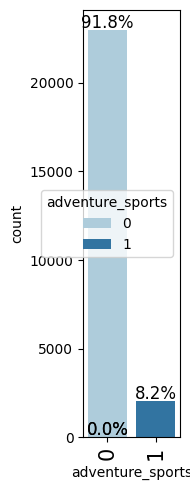

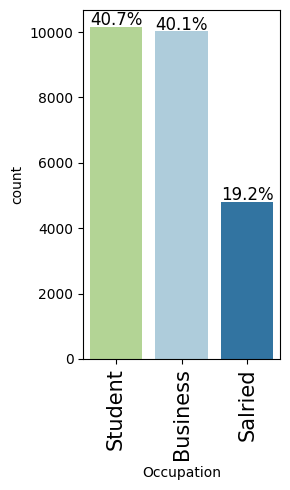

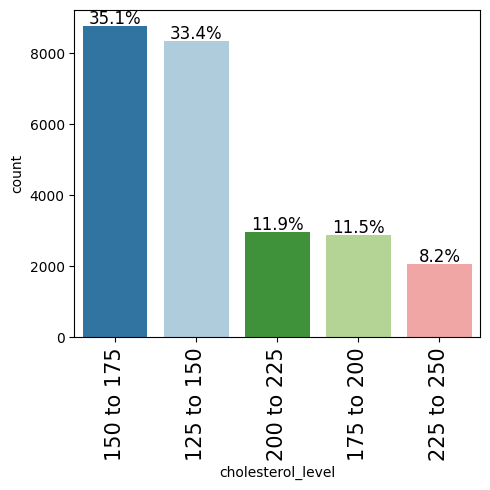

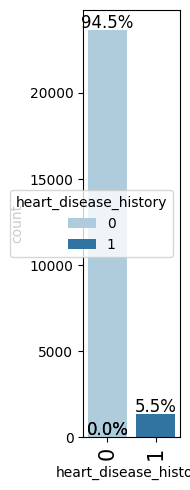

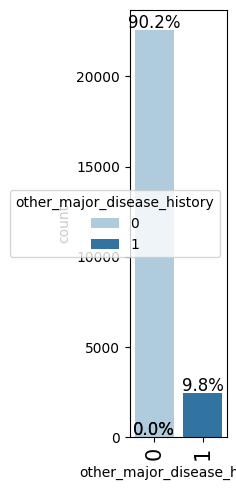

...

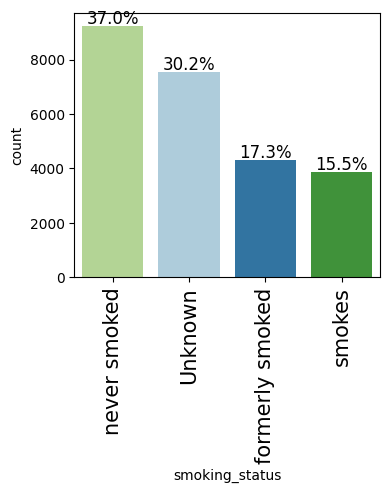

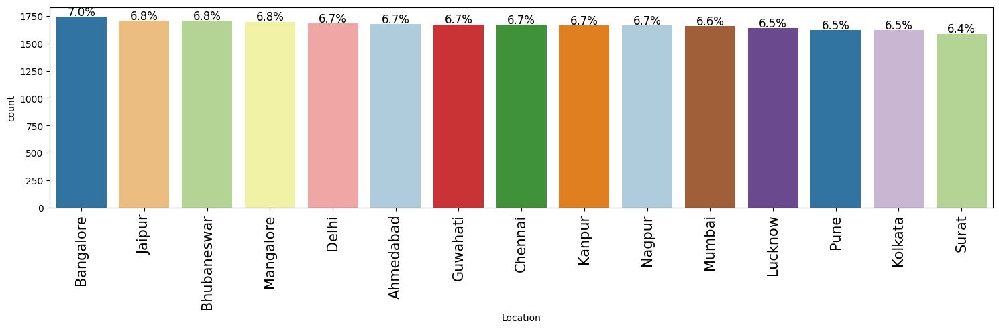

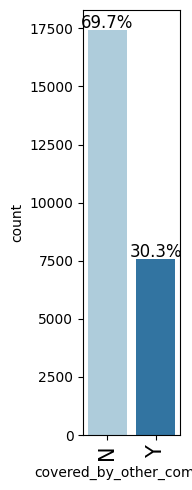

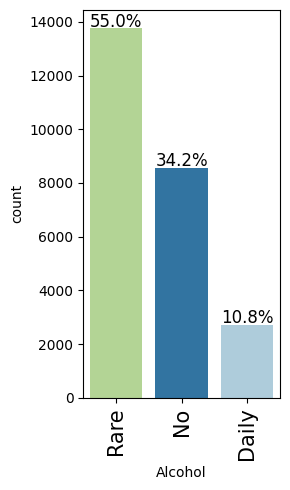

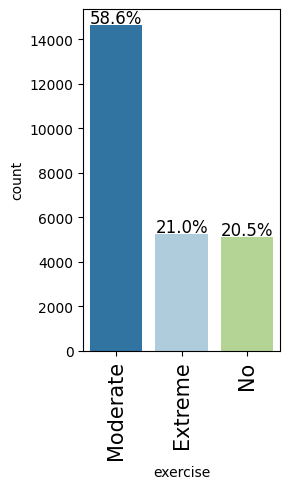

In [ ]:
# exclude = ['yr_of_estab','case_id','prevailing_wage','no_of_employees']
for cat_col in cat_cols:

    # plt.figure(figsize=(4, 12))
    labeled_barplot(df,cat_col,perc=True)
    plt.tight_layout()  # Prevent padding issues
    plt.savefig(f'D:/Data Science/Capstone Project/Capstone-Project-Health-Care/Images/Cat_{cat_col}.jpg')
    plt.show()



### 2.2 **Bivariate Analysis**

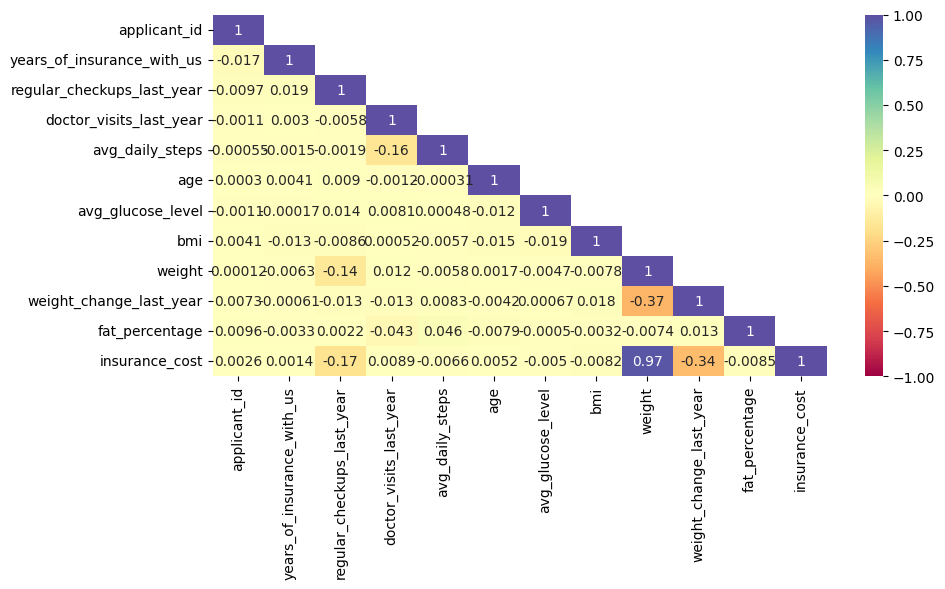

In [ ]:
plt.figure(figsize=(10,6))
sns.heatmap(df[num_cols].corr(),vmax=+1,vmin=-1, cmap="Spectral",annot=True, mask = np.triu(df[num_cols].corr(), +1))
plt.tight_layout()

# Save the figure with adjusted layout
plt.savefig(f'D:/Data Science/Capstone Project/Capstone-Project-Health-Care/Images/Bi_Heatmap.jpg', dpi=300, bbox_inches='tight')  # dpi increases resolution

<Figure size 1000x600 with 0 Axes>

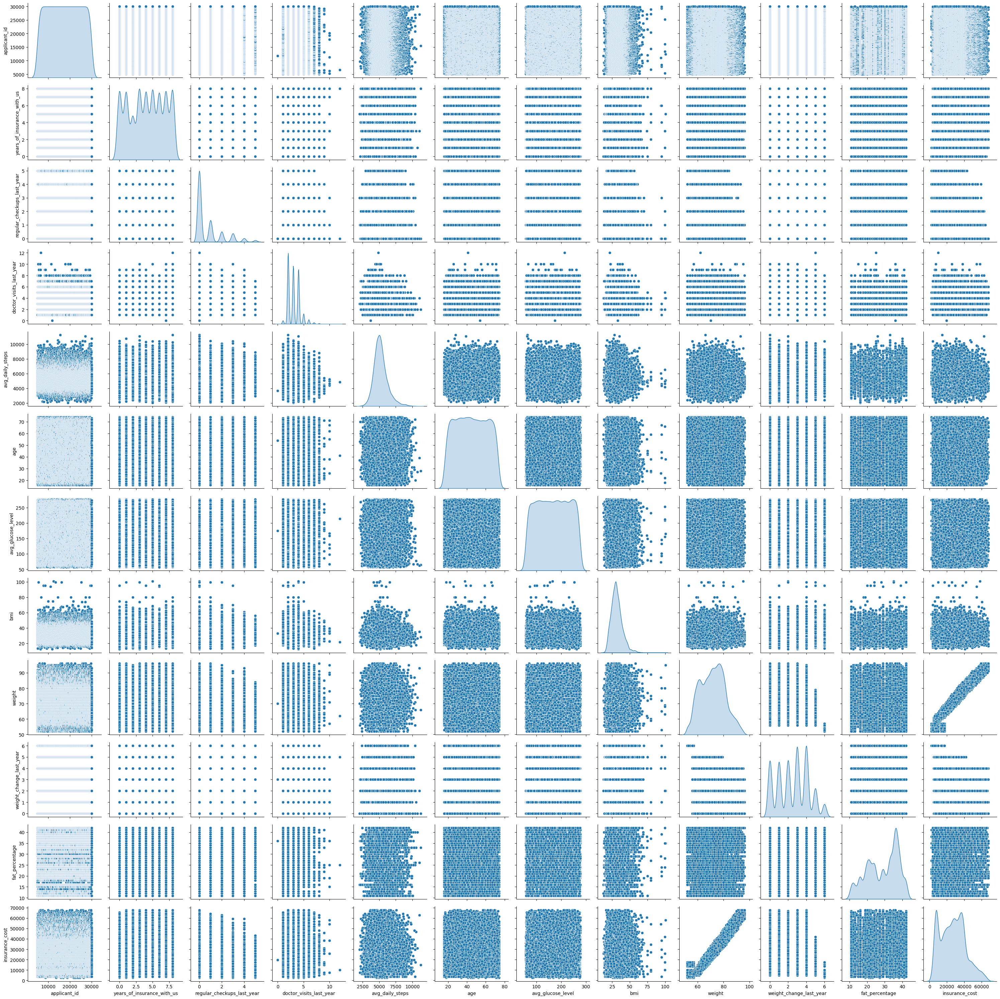

In [ ]:


# Assuming `df` is your DataFrame
plt.figure(figsize=(10, 6))

pairplot = sns.pairplot(df, diag_kind='kde')

# Adjust layout and save the plot
plt.tight_layout()
plt.savefig(f'D:/Data Science/Capstone Project/Capstone-Project-Health-Care/Images/Bi_Pairplot.jpg', dpi=300, bbox_inches='tight')



**Functions for bivariate analysis**

In [ ]:
def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title(f"Distribution of {target} for {target}=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    
    plt.savefig(f'D:/Data Science/Capstone Project/Capstone-Project-Health-Care/Images/Bi_dist_{predictor}_{target}.jpg', dpi=300, bbox_inches='tight')





def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)

    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count , 7))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    
    plt.savefig(f'D:/Data Science/Capstone Project/Capstone-Project-Health-Care/Images/Bi_stack_{predictor}_{target}.jpg', dpi=300, bbox_inches='tight')

def box_plot_two_variable(data, predictor1,predictor2):
    # Create subplots
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))  # Correct dimensions

    # Boxplot with outliers
    axs[0].set_title(f"Boxplot of {predictor1} vs {predictor2}")
    sns.boxplot(data=data, x=predictor2, y=predictor1,ax=axs[0], palette="gist_rainbow")

    # Boxplot without outliers
    axs[1].set_title(f"Boxplot (without outliers) of {predictor1} vs {predictor2}")
    sns.boxplot(
        data=data,
        x=predictor2,
        y=predictor1,
        ax=axs[1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    
    plt.savefig(
            f'D:/Data Science/Capstone Project/Capstone-Project-Health-Care/Images/Bi_boxplot_{predictor1}_{predictor2}.jpg',
            dpi=300,
            bbox_inches='tight'
        )

Occupation        Business  Salried  Student    All
adventure_sports                                   
All                  10020     4811    10169  25000
0                     9172     4454     9331  22957
1                      848      357      838   2043
------------------------------------------------------------------------------------------------------------------------
cholesterol_level  125 to 150  150 to 175  175 to 200  200 to 225  225 to 250  \
adventure_sports                                                                
All                      8339        8763        2881        2963        2054   
0                        7659        8024        2632        2734        1908   
1                         680         739         249         229         146   

cholesterol_level    All  
adventure_sports          
All                25000  
0                  22957  
1                   2043  
------------------------------------------------------------------------------

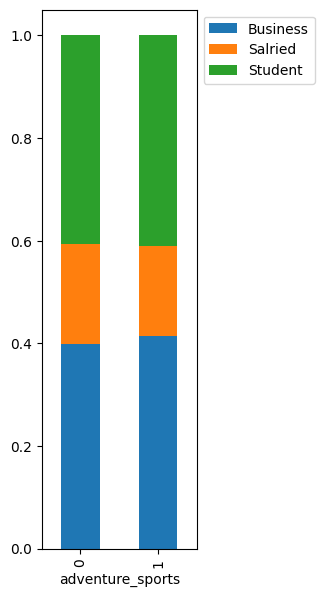

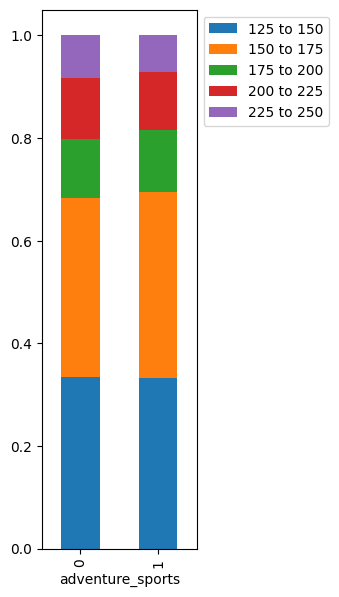

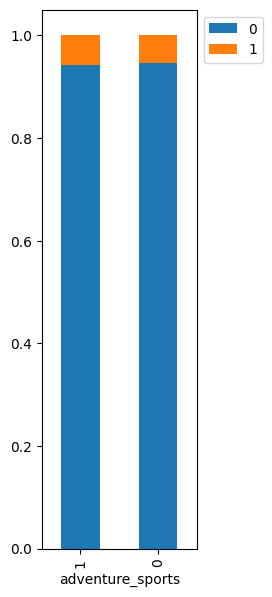

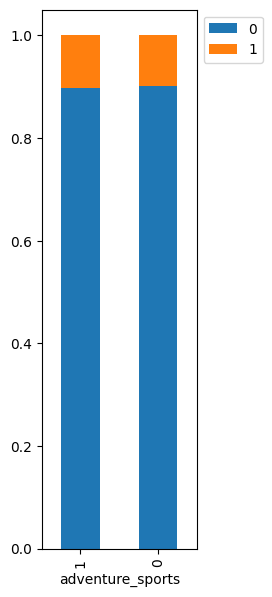

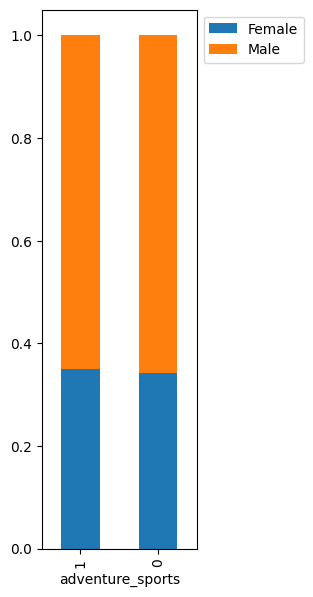

...

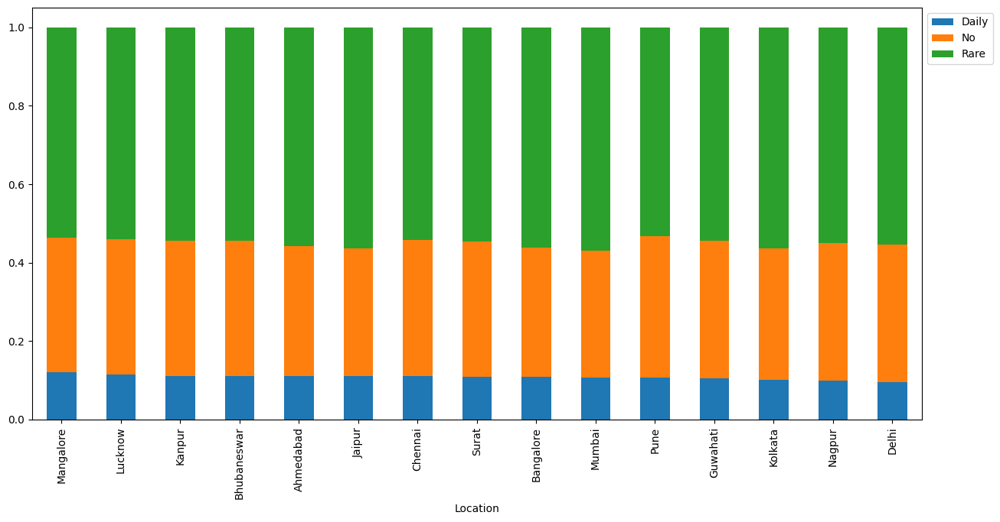

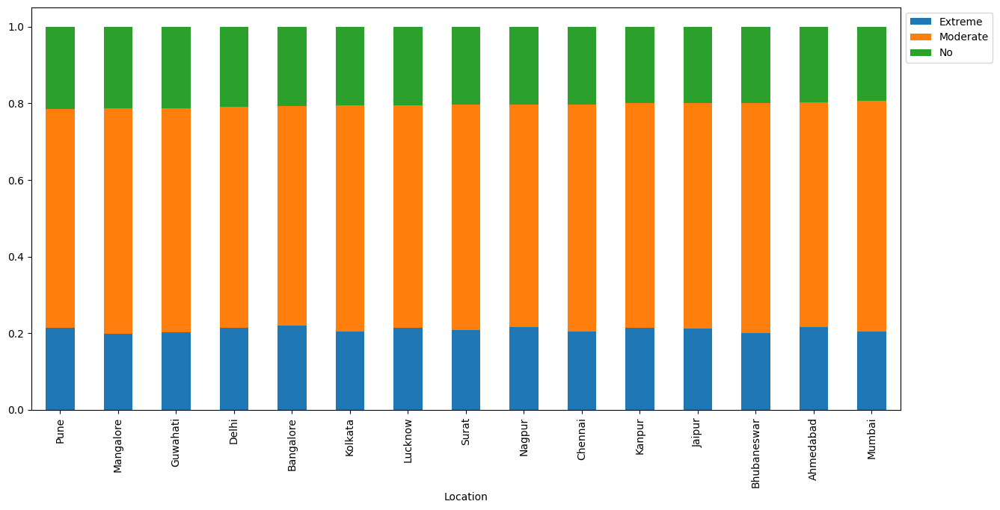

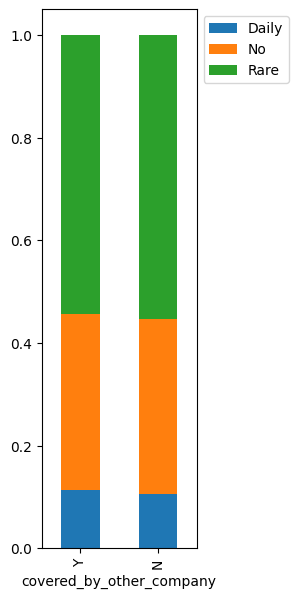

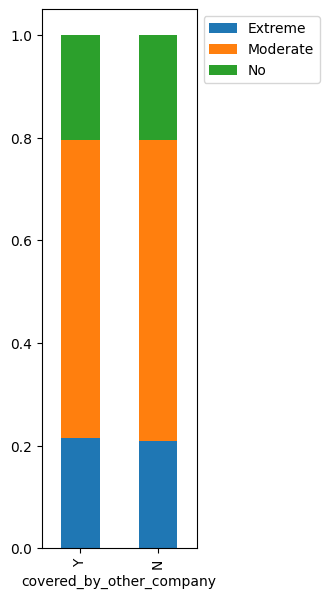

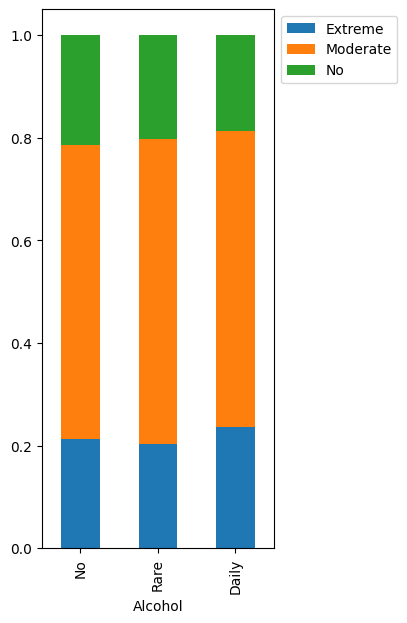

In [ ]:
for i in range(len(cat_cols)):
    for j in range(len(cat_cols)):
        if i<j:
            stacked_barplot(df,cat_cols[i],cat_cols[j])
        

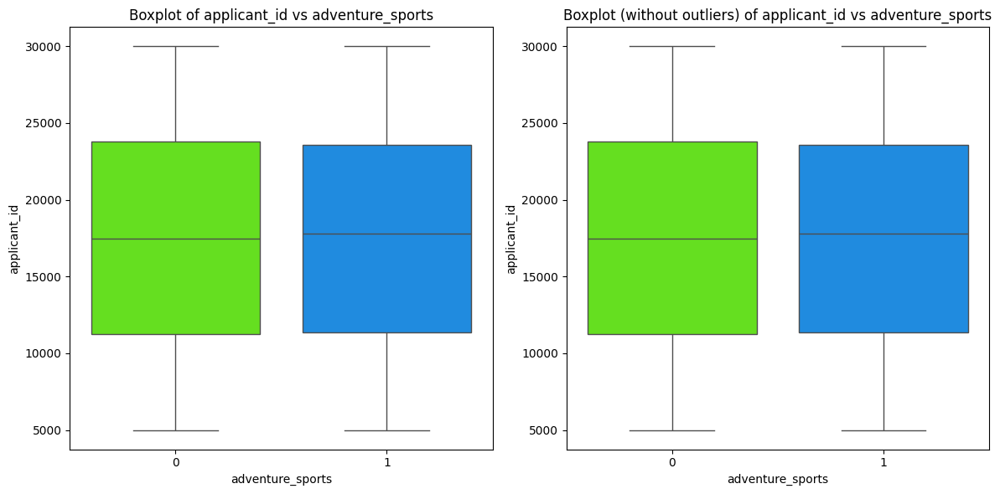

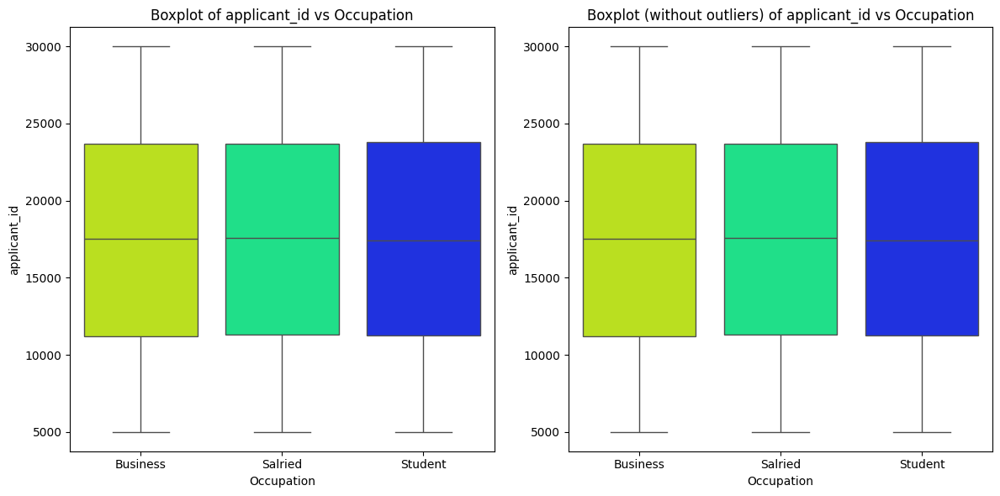

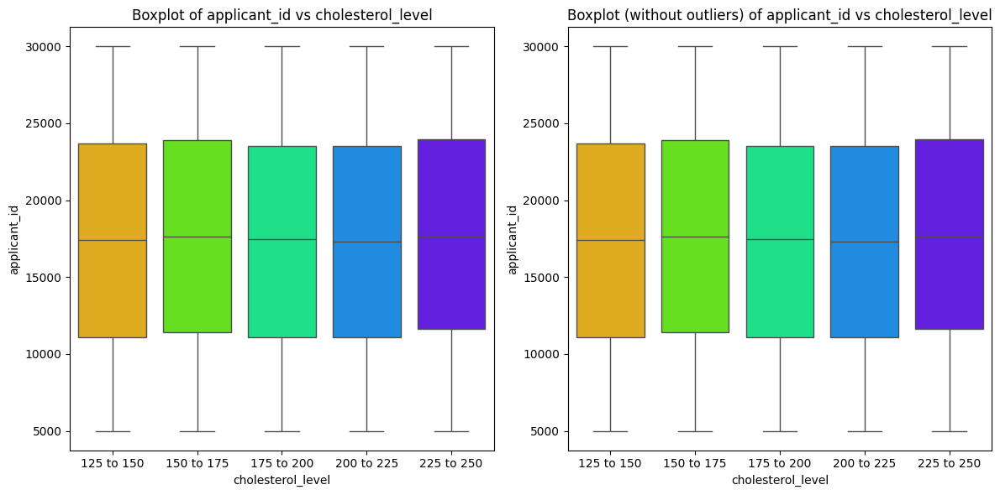

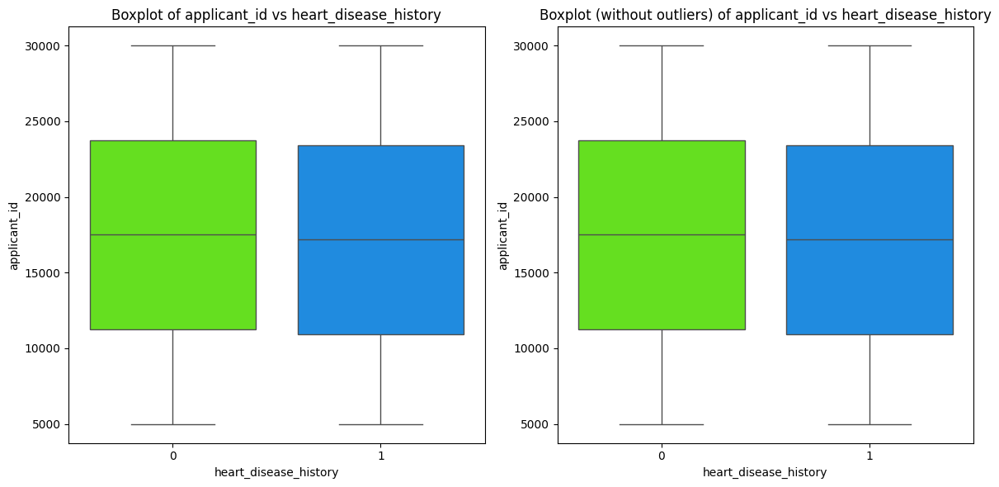

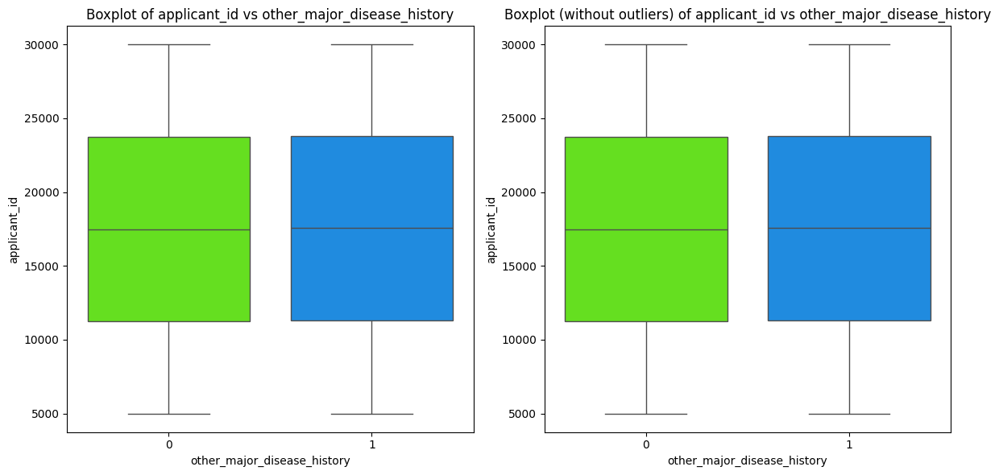

...

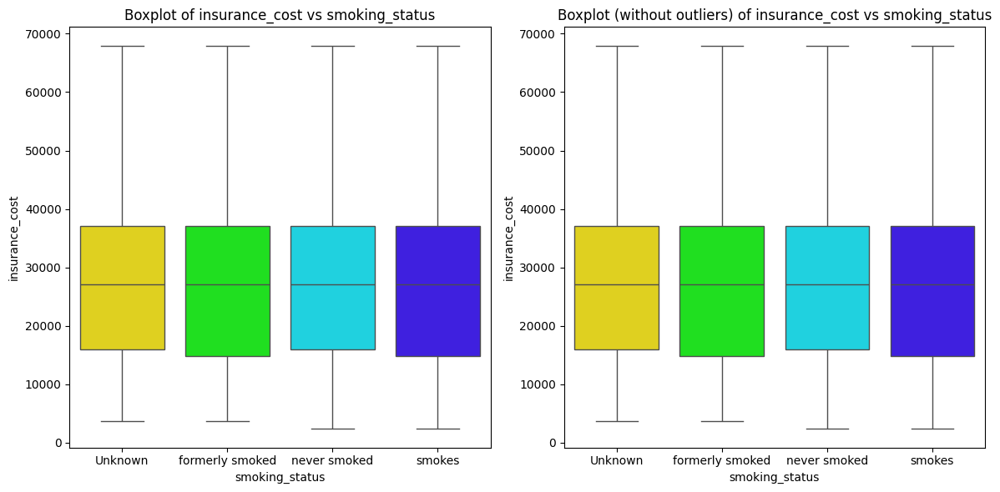

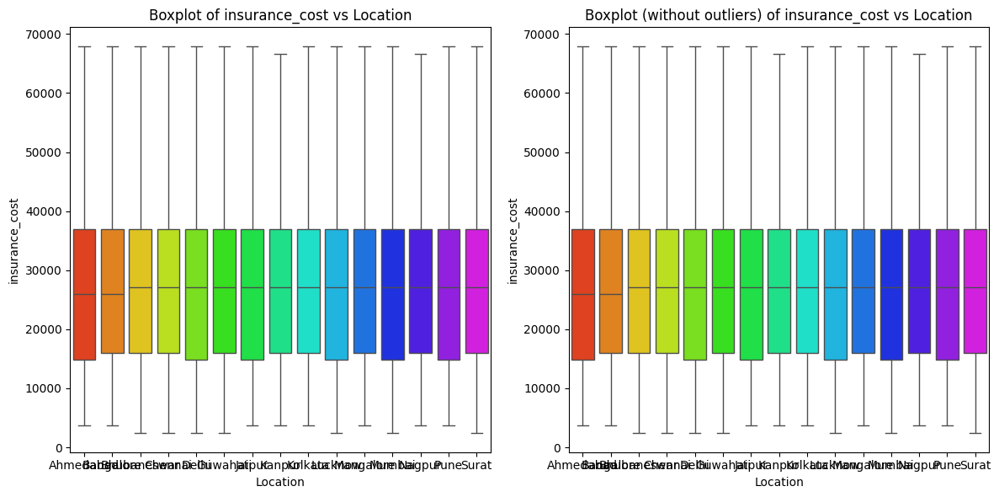

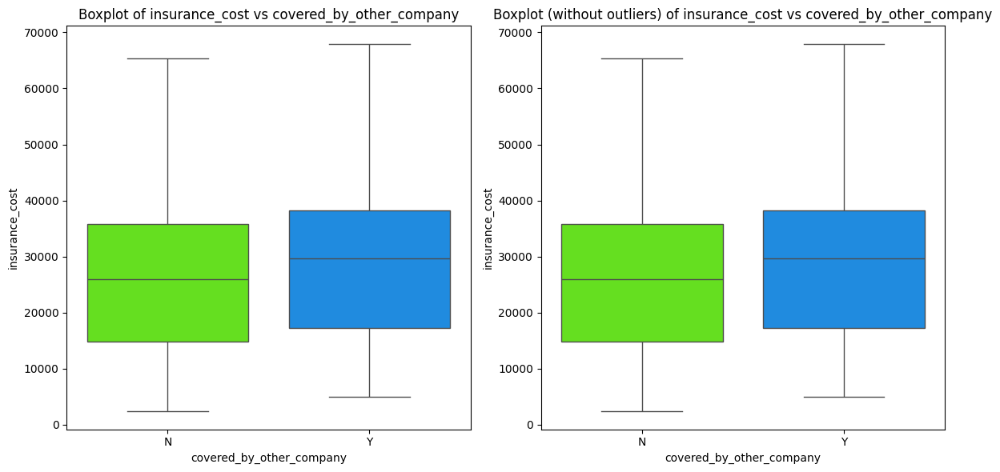

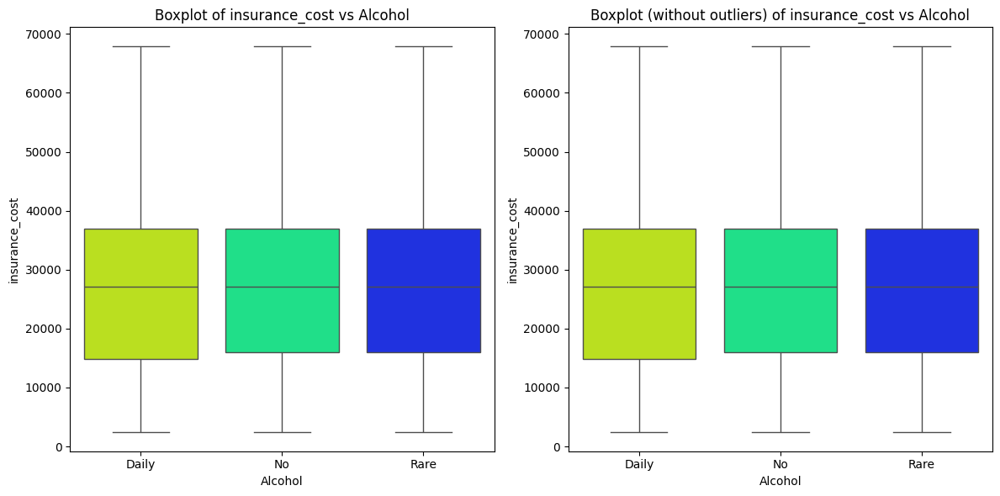

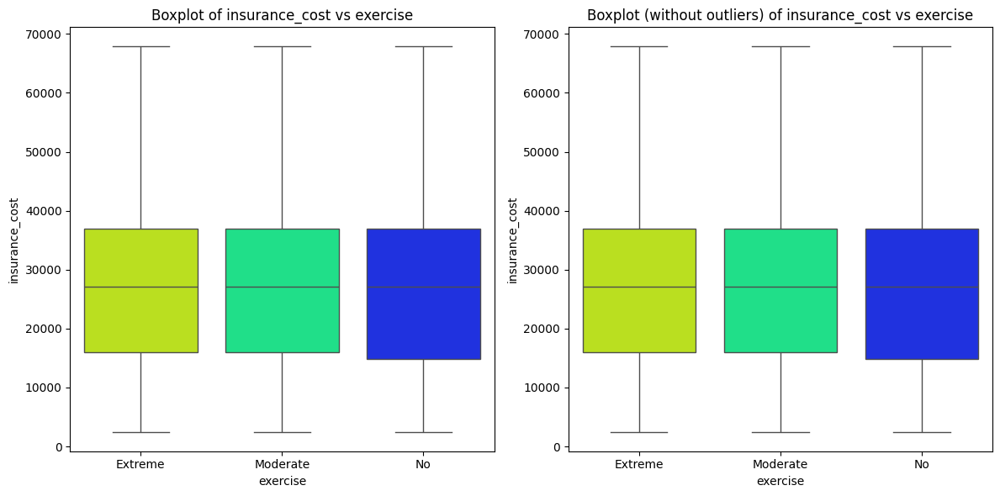

In [ ]:
for num_col in num_cols:
    for cat_col in cat_cols:


        box_plot_two_variable(df,num_col,cat_col)

## Outlier treatment - Winsorization

In [16]:

for num_col in num_cols:
    df[num_col]=np.clip(df[num_col],np.percentile(df[num_col],5),np.percentile(df[num_col],95))


## KNN Imputation + Encoding

In [17]:
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import numpy as np

# -----------------------------
# 🔧 Define column groups
# -----------------------------


ordinal_cols = ['cholesterol_level', 'Alcohol', 'exercise']
ordinal_categories = [
    ['125 to 150', '150 to 175', '175 to 200', '200 to 225', '225 to 250'],
    ['No', 'Rare', 'Daily'],
    ['No', 'Moderate', 'Extreme']
]


nominal_cols = ['Occupation', 'Gender', 'smoking_status', 'Location', 'covered_by_other_company']

cols_to_impute = ['bmi']  # 💡 ONLY these will be imputed using KNN

# -----------------------------
# 🔄 Preprocessing pipeline
# -----------------------------
preprocessor = ColumnTransformer(transformers=[
    ('num', StandardScaler(), num_cols),
    ('ord', OrdinalEncoder(categories=ordinal_categories), ordinal_cols),
    ('nom', OneHotEncoder(handle_unknown='ignore', sparse_output=False), nominal_cols)
], remainder='passthrough')


# -----------------------------
# 🏗️ Full pipeline: preprocessing + imputation
# -----------------------------
pipeline = Pipeline(steps=[
    ('preprocess', preprocessor),
    ('imputer', KNNImputer(n_neighbors=5))
])

# -----------------------------
# ⚙️ Apply pipeline
# -----------------------------
# Fit and transform
df_imputed_array = pipeline.fit_transform(df)

# Get new column names
# 1. Get nominal one-hot column names
encoded_nom_cols = pipeline.named_steps['preprocess'].named_transformers_['nom'].get_feature_names_out(nominal_cols)
all_transformed_cols = (
    num_cols +
    ordinal_cols +
    list(encoded_nom_cols) +
    [col for col in df.columns if col not in (num_cols + ordinal_cols + nominal_cols)]
)

# 2. Create DataFrame
df_encoded = pd.DataFrame(df_imputed_array, columns=all_transformed_cols, index=df.index)

# -----------------------------
# ✅ Update only imputed columns in original df
# -----------------------------
for col in cols_to_impute:
    if col in df.columns and col in df_encoded.columns:
        df[col] = df_encoded[col]

# -----------------------------
# 🧼 Null check
# -----------------------------
print(df[cols_to_impute].isnull().sum())


bmi    0
dtype: int64


### Clustering

In [119]:
df_encoded

,applicant_id,years_of_insurance_with_us,regular_checkups_last_year,doctor_visits_last_year,avg_daily_steps,age,avg_glucose_level,bmi,weight,weight_change_last_year,...,Location_Mangalore,Location_Mumbai,Location_Nagpur,Location_Pune,Location_Surat,covered_by_other_company_N,covered_by_other_company_Y,adventure_sports,heart_disease_history,other_major_disease_history
0,-1.731982,-0.417807,0.188690,-0.967205,-0.332228,-1.050360,-1.124370,-0.026352,-0.494422,-0.898041,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
1,-1.731843,-1.568750,-0.645043,0.784661,1.134787,0.315492,0.708929,0.360280,-1.459569,0.285180,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,-1.731704,-1.185102,-0.645043,0.784661,-0.671209,1.433007,-0.024391,1.159320,0.149010,-1.489652,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-1.731566,1.116783,2.689890,-0.967205,0.947731,0.377576,-0.933069,-1.096036,-0.065467,0.285180,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,-1.731427,-0.417807,0.188690,-0.967205,-0.263863,-0.057013,-0.789594,-0.632077,0.256249,-1.489652,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,1.731427,-0.417807,-0.645043,0.784661,0.378016,-1.422864,-0.359167,0.605147,0.792442,0.876791,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
24996,1.731566,0.733135,-0.645043,0.784661,-0.471809,0.812165,-0.534526,-0.013465,-0.601660,-0.306431,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
24997,1.731704,1.116783,-0.645043,-0.967205,0.387511,-0.677855,-0.263517,0.027776,0.470726,-0.898041,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
24998,1.731843,-1.185102,-0.645043,-0.967205,5.280411,-1.112444,-1.618564,-0.619189,0.256249,-1.489652,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0


## K-KPrototypes Clustering

Number of Clusters: 2 	Cost: 2962453199945.42 	Time: 808.74 sec
Number of Clusters: 3 	Cost: 2117549074510.31 	Time: 993.90 sec
Number of Clusters: 4 	Cost: 1620259834327.93 	Time: 2334.38 sec
Number of Clusters: 5 	Cost: 1262144880988.61 	Time: 1641.44 sec
Number of Clusters: 6 	Cost: 1023404501780.45 	Time: 4817.05 sec


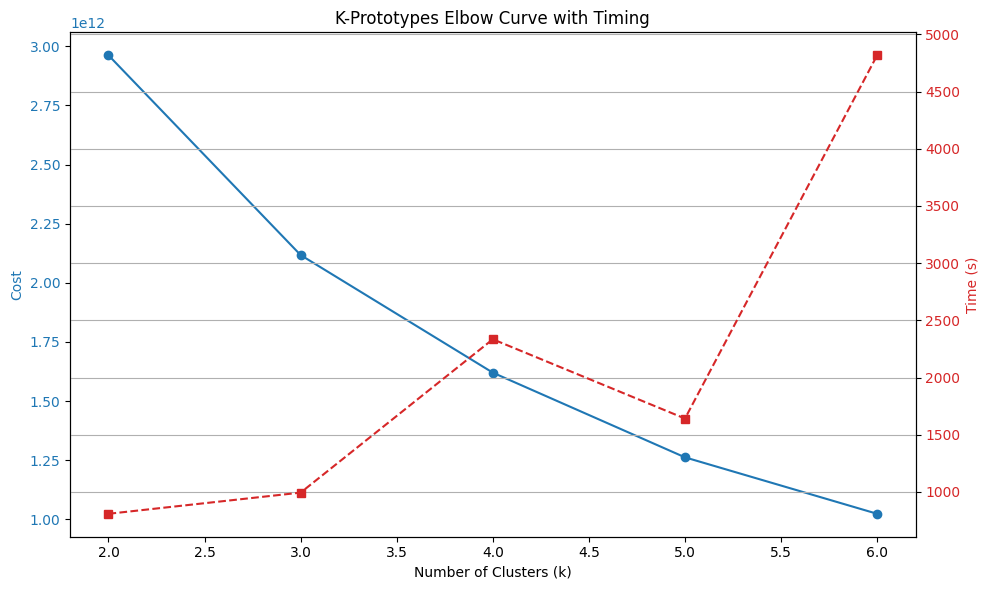

In [ ]:
from kmodes.kprototypes import KPrototypes
import numpy as np
import matplotlib.pyplot as plt
import time

# 🔧 Get categorical column indices
categorical_idx = [df.columns.get_loc(col) for col in cat_cols]

# 🧹 Convert categorical columns to string
df_kproto = df.copy()
df_kproto[cat_cols] = df_kproto[cat_cols].astype(str)
df_matrix = df_kproto.to_numpy()

# 📊 Elbow method with cost and timing
clusters = range(2, 7)
costs = []
times = []

for k in clusters:
    start = time.time()
    kproto = KPrototypes(n_clusters=k, init='Cao', random_state=1, n_init=5)
    kproto.fit(df_matrix, categorical=categorical_idx)
    end = time.time()

    elapsed_time = end - start
    costs.append(kproto.cost_)
    times.append(elapsed_time)
    # Assign clusters back to dataframe
    df_KProto_group_labels[f'KProto_group_{k}'] = kproto.labels_

    print(f"Number of Clusters: {k} \tCost: {kproto.cost_:.2f} \tTime: {elapsed_time:.2f} sec")

# 📈 Plotting cost and time
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:blue'
ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('Cost', color=color)
ax1.plot(clusters, costs, marker='o', linestyle='-', color=color, label='Cost')
ax1.tick_params(axis='y', labelcolor=color)

# ⏱ Add time on secondary y-axis
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Time (s)', color=color)
ax2.plot(clusters, times, marker='s', linestyle='--', color=color, label='Time')
ax2.tick_params(axis='y', labelcolor=color)

plt.title('K-Prototypes Elbow Curve with Timing')
fig.tight_layout()
plt.grid(True)
plt.savefig('Images_bi_reqd/kprototypes_elbow_with_time.jpg', dpi=100)
plt.show()


In [ ]:
# from kmodes.kprototypes import KPrototypes
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# from collections import defaultdict
# from joblib import Parallel, delayed
# import time

# # --- Data preparation (df and cat_cols must be defined already) ---
# df_kproto = df.copy()
# df_kproto[cat_cols] = df_kproto[cat_cols].astype(str)
# df_matrix = df_kproto.to_numpy()
# categorical_idx = [df.columns.get_loc(col) for col in cat_cols]

# # --- Distance function for K-Prototypes ---
# def kproto_distance(x, y, cat_idx, gamma=1.0):
#     num_idx = np.setdiff1d(np.arange(len(x)), cat_idx)
#     num_dist = np.sum((x[num_idx].astype(float) - y[num_idx].astype(float)) ** 2)
#     cat_dist = np.sum(x[cat_idx] != y[cat_idx])
#     return num_dist + gamma * cat_dist

# # --- Silhouette Score per point ---
# def silhouette_for_point(i, data, labels, cat_idx, gamma):
#     n = len(data)
#     same_cluster = [j for j in range(n) if labels[j] == labels[i] and j != i]
#     other_clusters = defaultdict(list)
#     for j in range(n):
#         if labels[j] != labels[i]:
#             other_clusters[labels[j]].append(j)

#     a = np.mean([kproto_distance(data[i], data[j], cat_idx, gamma) for j in same_cluster]) if same_cluster else 0

#     b = np.inf
#     for cluster_points in other_clusters.values():
#         b_dist = np.mean([kproto_distance(data[i], data[j], cat_idx, gamma) for j in cluster_points])
#         b = min(b, b_dist)

#     return (b - a) / max(a, b) if max(a, b) > 0 else 0

# # --- Manual silhouette score for entire dataset ---
# def silhouette_score_kproto(data, labels, cat_idx, gamma=1.0, n_jobs=-1):
#     scores = Parallel(n_jobs=n_jobs)(
#         delayed(silhouette_for_point)(i, data, labels, cat_idx, gamma)
#         for i in range(len(data))
#     )
#     return np.mean(scores)

# # --- Clustering and scoring loop ---
# cluster_range = range(2, 7)
# silhouette_scores = []
# costs = []
# times = []

# for k in cluster_range:
#     start = time.time()
#     model = KPrototypes(n_clusters=k, init='Cao', n_init=5, verbose=0, random_state=42)
#     labels = model.fit_predict(df_matrix, categorical=categorical_idx)
#     elapsed = time.time() - start

#     score = silhouette_score_kproto(df_matrix, labels, categorical_idx, gamma=model.gamma)
    
#     silhouette_scores.append(score)
#     costs.append(model.cost_)
#     times.append(elapsed)

#     print(f"k={k}, Silhouette Score: {score:.4f}, Cost: {model.cost_:.2f}, Time: {elapsed:.2f}s")

# # 📊 Plotting Silhouette, Cost, and Time in subplots
# fig, axs = plt.subplots(3, 1, figsize=(10, 14), sharex=True)

# # --- Silhouette Score ---
# axs[0].plot(cluster_range, silhouette_scores, marker='o', color='tab:blue')
# axs[0].set_ylabel('Silhouette Score', fontsize=12)
# axs[0].set_title('K-Prototypes Clustering Metrics', fontsize=14)
# axs[0].grid(True)

# # --- Cost ---
# axs[1].plot(cluster_range, costs, marker='s', color='tab:green')
# axs[1].set_ylabel('Cost (Distortion)', fontsize=12)
# axs[1].grid(True)

# # --- Time to Fit ---
# axs[2].plot(cluster_range, times, marker='x', linestyle='--', color='tab:red')
# axs[2].set_xlabel('Number of Clusters (k)', fontsize=12)
# axs[2].set_ylabel('Fit Time (sec)', fontsize=12)
# axs[2].grid(True)

# plt.tight_layout()
# plt.savefig('Images_bi_reqd/kprototypes_silhouette_cost_time_combined.jpg', dpi=100)
# plt.show()




**Final Model**

In [18]:
from kmodes.kprototypes import KPrototypes
import numpy as np
import matplotlib.pyplot as plt


# 🔧 Get categorical column indices
categorical_idx = [df.columns.get_loc(col) for col in cat_cols]

# 🧹 Convert categorical columns to string
df_kproto = df.copy()
df_kproto[cat_cols] = df_kproto[cat_cols].astype(str)
df_matrix = df_kproto.to_numpy()
kproto = KPrototypes(n_clusters=4, init='Cao', random_state=1, n_init=5)
kproto.fit(df_matrix, categorical=categorical_idx)
# Assign clusters back to dataframe
df['KProto_group'] = kproto.labels_
df

,applicant_id,years_of_insurance_with_us,regular_checkups_last_year,adventure_sports,Occupation,doctor_visits_last_year,cholesterol_level,avg_daily_steps,age,heart_disease_history,...,smoking_status,Location,weight,covered_by_other_company,Alcohol,exercise,weight_change_last_year,fat_percentage,insurance_cost,KProto_group
0,5000,3,1,1,Salried,2,125 to 150,4866,28,1,...,Unknown,Chennai,67,N,Rare,Moderate,1,25,20978,3
1,5001,0,0,0,Student,4,150 to 175,6411,50,0,...,formerly smoked,Jaipur,58,N,Rare,Moderate,3,27,6170,0
2,5002,1,0,0,Business,4,200 to 225,4509,68,0,...,formerly smoked,Jaipur,73,N,Daily,Extreme,0,32,28382,3
3,5003,7,4,0,Business,2,175 to 200,6214,51,0,...,Unknown,Chennai,71,Y,Rare,No,3,37,27148,3
4,5004,3,1,0,Student,2,150 to 175,4938,44,0,...,never smoked,Bangalore,74,N,No,Extreme,0,34,29616,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,29995,3,0,0,Salried,4,225 to 250,5614,22,0,...,smokes,Kanpur,79,Y,Rare,Moderate,4,40,39488,1
24996,29996,6,0,0,Business,4,200 to 225,4719,58,0,...,never smoked,Kanpur,66,N,Rare,Moderate,2,28,14808,0
24997,29997,7,0,1,Student,2,150 to 175,5624,34,0,...,Unknown,Bhubaneswar,76,N,Rare,Moderate,1,35,33318,1
24998,29998,1,0,0,Salried,2,225 to 250,10777,27,0,...,Unknown,Surat,74,N,Rare,Moderate,0,40,30850,1


## Cluster Profiling

## Before clustering you can also use rfe method to only include the top 10 columns for clustering 

In [19]:
cluster_profile = df.groupby('KProto_group')[df.columns].mean(numeric_only=True)
# displaying the group-wise means of variables
cluster_profile



,applicant_id,years_of_insurance_with_us,regular_checkups_last_year,doctor_visits_last_year,avg_daily_steps,age,avg_glucose_level,bmi,weight,weight_change_last_year,fat_percentage,insurance_cost,KProto_group
KProto_group,,,,,,,,,,,,,
0,17517.024358,4.081229,0.957654,3.094190,5213.514525,44.843464,168.149944,0.011037,61.694525,3.282682,28.883687,11909.409832,0.0
1,23977.563231,4.084048,0.755029,3.092157,5228.927647,44.929206,167.621862,0.005112,74.861063,2.118353,28.846094,31691.459847,1.0
2,17398.981363,4.027192,0.316835,3.119157,5197.968836,45.192484,167.137183,-0.017328,86.410632,2.000000,28.616560,51726.203483,2.0
3,10998.609837,4.136864,0.768699,3.122722,5215.306882,44.871622,166.767599,-0.006200,74.668448,2.111565,28.778441,31357.444689,3.0


In [33]:
cluster_profile['count']=df['KProto_group'].value_counts()
cluster_profile.style.highlight_max(color="magenta", axis=0)

,applicant_id,years_of_insurance_with_us,regular_checkups_last_year,doctor_visits_last_year,avg_daily_steps,age,avg_glucose_level,bmi,weight,weight_change_last_year,fat_percentage,insurance_cost,KProto_group,count
KProto_group,,,,,,,,,,,,,,
0,17517.024358,4.081229,0.957654,3.094190,5213.514525,44.843464,168.149944,0.011037,61.694525,3.282682,28.883687,11909.409832,0.000000,8950
1,23977.563231,4.084048,0.755029,3.092157,5228.927647,44.929206,167.621862,0.005112,74.861063,2.118353,28.846094,31691.459847,1.000000,6413
2,17398.981363,4.027192,0.316835,3.119157,5197.968836,45.192484,167.137183,-0.017328,86.410632,2.000000,28.616560,51726.203483,2.000000,3273
3,10998.609837,4.136864,0.768699,3.122722,5215.306882,44.871622,166.767599,-0.006200,74.668448,2.111565,28.778441,31357.444689,3.000000,6364


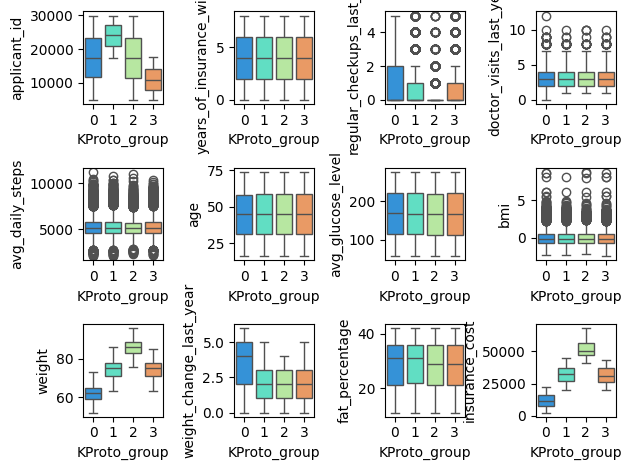

In [22]:


for i,col in enumerate(num_cols):
    # print(i)
    plt.subplot(3,4,i+1)
    plt.tight_layout()  # Prevent padding issues
    sns.boxplot(x=df['KProto_group'],y=df[f"{col}"],palette='rainbow')
    plt.savefig('Images_bi_reqd/kprototypes_boxplots.jpg', dpi=100)

<Figure size 2000x2600 with 0 Axes>

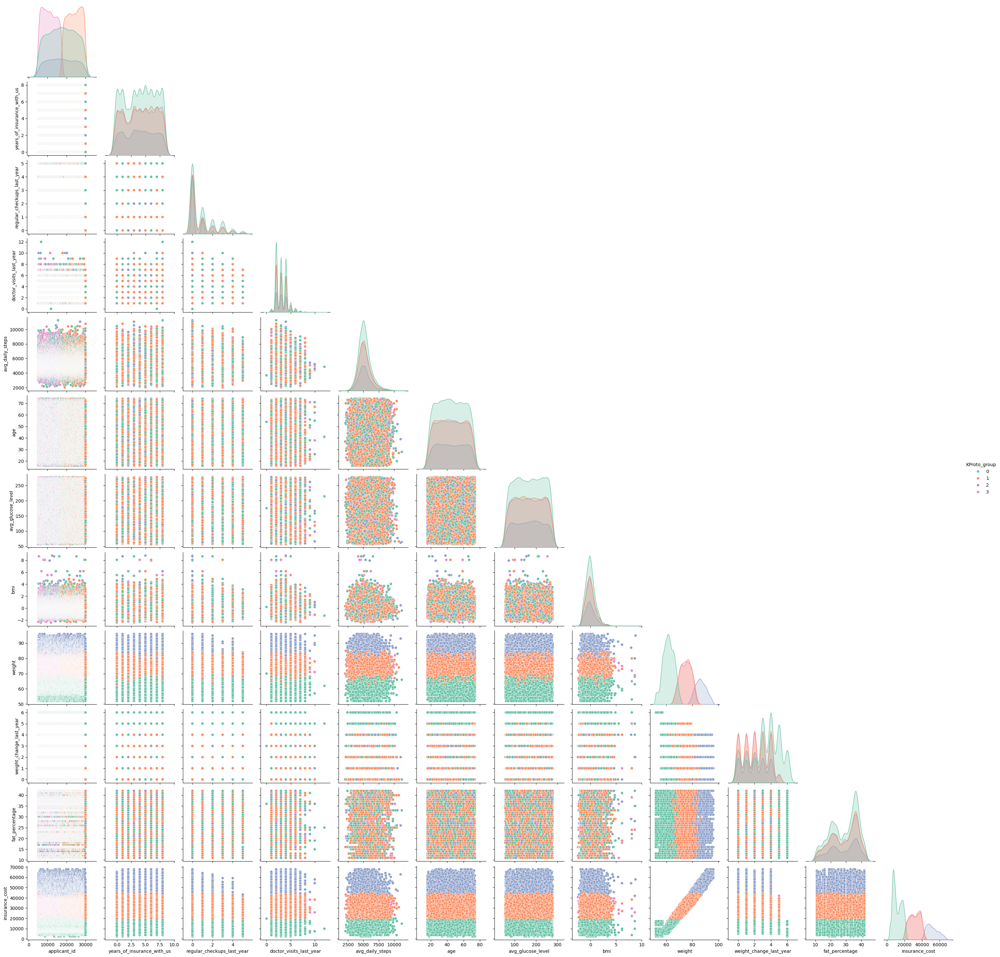

In [23]:
plt.figure(figsize=(20, 26))

sns.pairplot(df, diag_kind='kde', corner=True, hue='KProto_group', palette='Set2');
plt.savefig(f'Images_bi_reqd/pairplot2.jpg',dpi=100)

In [25]:
for i in cat_cols:
    profile = pd.crosstab(df.KProto_group,df[i])
    
    profile.style.highlight_max(color="magenta", axis=0)
    profile.style.highlight_min(color="khaki", axis=0)
    print(profile)


adventure_sports     0    1
KProto_group               
0                 8457  493
1                 5800  613
2                 2941  332
3                 5759  605
Occupation    Business  Salried  Student
KProto_group                            
0                 3543     1727     3680
1                 2544     1286     2583
2                 1335      602     1336
3                 2598     1196     2570
cholesterol_level  125 to 150  150 to 175  175 to 200  200 to 225  225 to 250
KProto_group                                                                 
0                        2959        3186        1017        1034         754
1                        2137        2264         735         720         557
2                        1080        1150         363         430         250
3                        2163        2163         766         779         493


heart_disease_history     0    1
KProto_group                    
0                      8451  499
1                      6072  341
2                      3094  179
3                      6017  347
other_major_disease_history     0    1
KProto_group                          
0                            8068  882
1                            5780  633
2                            2959  314
3                            5739  625
Gender        Female  Male
KProto_group              
0               3047  5903
1               2188  4225
2               1142  2131
3               2201  4163
smoking_status  Unknown  formerly smoked  never smoked  smokes
KProto_group                                                  
0                  2671             1563          3341    1375
1                  1926             1100          2372    1015
2                  1039              575          1183     476
3                  1919             1091          2353    1001
Location      Ahmedabad  Ban

## ML Model Building

### Splitting training dataset into train and validation set

In [18]:
from sklearn.model_selection import train_test_split
x = df_encoded.drop('insurance_cost', axis=1)
y = df_encoded['insurance_cost']

x_train, x_val, y_train, y_val = train_test_split(x, y, test_size=0.2, random_state=21)



In [19]:
x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=0.2, random_state=21)

In [ ]:
import pandas as pd
import time
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.ensemble import (BaggingRegressor, RandomForestRegressor,
                              GradientBoostingRegressor, AdaBoostRegressor,
                              ExtraTreesRegressor)
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

from sklearn.linear_model import LinearRegression, Ridge
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler


# # Models that require scaling
# models_needing_scaling = ['Linear Regression', 'Ridge', 'SVR', 'KNN']

# # Apply StandardScaler only once
# scaler = StandardScaler()
# x_train_scaled = scaler.fit_transform(x_train)  # Fit only on train
# x_test_scaled = scaler.transform(x_test)        # Transform test using train's scaler

# Define regression models
models = [
    ("Bagging", BaggingRegressor(random_state=1)),
    ("Random Forest", RandomForestRegressor(random_state=1)),
    ("GBM", GradientBoostingRegressor(random_state=1)),
    ("AdaBoost", AdaBoostRegressor(random_state=1)),
    ("XGBoost", XGBRegressor(random_state=1, eval_metric='rmse')),
    ("Decision Tree", DecisionTreeRegressor(random_state=1)),
    ("Extra Trees", ExtraTreesRegressor(random_state=1)),
    ("Ridge", Ridge(random_state=1)),
    ("Linear Regression", LinearRegression()),
    ("SVR", SVR()),
    ("KNN", KNeighborsRegressor())
]

# Initialize result storage
results = []
names = []
times = []

print('Cross-validation performance (RMSE):\n')

# Cross-validation evaluation
for name, model in models:
    start_time = time.time()
    kfold = KFold(n_splits=10, shuffle=True, random_state=1)
    
    # Choose scaled or unscaled input
    # X_input = x_train_scaled if name in models_needing_scaling else x_train
    X_input = x_train
    
    
    # Negative RMSE returned, so take negative of result
    cv_result = cross_val_score(model, X_input, y_train,
                                cv=kfold, scoring='neg_root_mean_squared_error')
    end_time = time.time()

    results.append(cv_result)
    names.append(name)
    times.append(end_time - start_time)

    print(f'{name:<17}: RMSE = {-cv_result.mean():.4f}, Time = {end_time - start_time:.2f} seconds')

# Prepare data for plot
mean_rmses = [-r.mean() for r in results]
rmse_df = pd.DataFrame({'Model': names, 'RMSE': mean_rmses})

# Plotting RMSE with labels
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
barplot = sns.barplot(x='RMSE', y='Model', data=rmse_df, palette='viridis')

# Add RMSE value labels to bars
for index, value in enumerate(rmse_df['RMSE']):
    plt.text(value + 100, index, f"{value:.2f}", va='center')

plt.title('Model Comparison: Cross-Validated RMSE')
plt.xlabel('RMSE (lower is better)')
plt.ylabel('Model')
plt.tight_layout()

# Save and display
plt.savefig('C:/Users/sangr/Downloads/INTERN/RMSE_Comparison.jpg', dpi=300)
plt.show()


# Top 5-6 modes out of all the models built are:
- 
-
-
-
-
-
- 

# Ridge Model

In [21]:
import time
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, make_scorer

# --- Define RMSE scorer ---
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

rmse_scorer = make_scorer(rmse, greater_is_better=False)

# --- Evaluation Function ---
def regression_performance_evaluation(model, predictors, target):
    pred = model.predict(predictors)
    mape = mean_absolute_percentage_error(target, pred) * 100
    rmse_val = rmse(target, pred)
    r2 = r2_score(target, pred)
    n = len(target)
    k = predictors.shape[1]
    adj_r2 = 1 - (1 - r2) * (n - 1) / (n - k - 1)

    return pd.DataFrame({
        "MAPE (%)": [mape],
        "RMSE": [rmse_val],
        "R²": [r2],
        "Adjusted R²": [adj_r2]
    })

# --- Define Ridge model ---
ridge = Ridge(random_state=1)

# --- Hyperparameter grid ---
param_grid = {
    'alpha': np.logspace(-4, 4, 100),  # 100 values from 1e-4 to 1e4 (log scale)
    # Optionally add:
    'fit_intercept': [True, False],
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'saga']
}

# --- Randomized Search Setup ---
search = RandomizedSearchCV(
    estimator=ridge,
    param_distributions=param_grid,
    n_iter=200,
    scoring=rmse_scorer,
    cv=5,
    random_state=1,
    verbose=1,
    n_jobs=-1
)

# --- Fit and Time ---
start_time = time.time()
search.fit(x_train, y_train)
print(f"\nRandomizedSearchCV fitting time: {time.time() - start_time:.2f} seconds")

# --- Best Parameters and Score ---
print("Best Parameters:", search.best_params_)
print("Best Cross-Validation RMSE:", -search.best_score_)

# --- Retrain Best Estimator ---
best_ridge = search.best_estimator_
best_ridge.fit(x_train, y_train)

# --- Evaluate on Train and Validation ---
print("\nTraining Performance:")
train_perf_Ridge = regression_performance_evaluation(best_ridge, x_train, y_train)
print(train_perf_Ridge)

print("\nValidation Performance:")
val_perf_Ridge = regression_performance_evaluation(best_ridge, x_val, y_val)
print(val_perf_Ridge)

# --- Optional: Overfitting Check ---
rmse_gap = val_perf_Ridge["RMSE"][0] - train_perf_Ridge["RMSE"][0]
print(f"\nRMSE Gap (Val - Train): {rmse_gap:.4f} → {'Overfitting' if rmse_gap > 5 else 'Acceptable'}")


Fitting 5 folds for each of 200 candidates, totalling 1000 fits



RandomizedSearchCV fitting time: 206.98 seconds
Best Parameters: {'solver': 'saga', 'fit_intercept': False, 'alpha': np.float64(17.886495290574352)}
Best Cross-Validation RMSE: 0.22369821189062872

Training Performance:
    MAPE (%)      RMSE        R²  Adjusted R²
0  68.648366  0.223115  0.950569     0.950439

Validation Performance:
    MAPE (%)      RMSE        R²  Adjusted R²
0  71.785581  0.223516  0.949389     0.948961

RMSE Gap (Val - Train): 0.0004 → Acceptable


# LGBM Model

In [27]:
import time
import numpy as np
import pandas as pd
from lightgbm import LGBMRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, make_scorer

# --- Define RMSE scorer ---
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

rmse_scorer = make_scorer(rmse, greater_is_better=False)

# --- Evaluation Function ---
def regression_performance_evaluation(model, predictors, target):
    pred = model.predict(predictors)
    mape = mean_absolute_percentage_error(target, pred) * 100
    rmse_val = rmse(target, pred)
    r2 = r2_score(target, pred)
    n = len(target)
    k = predictors.shape[1]
    adj_r2 = 1 - (1 - r2) * (n - 1) / (n - k - 1)

    return pd.DataFrame({
        "MAPE (%)": [mape],
        "RMSE": [rmse_val],
        "R²": [r2],
        "Adjusted R²": [adj_r2]
    })

# --- Define LGBM Model ---
lgbm = LGBMRegressor(random_state=1, n_jobs=-1)

# --- Hyperparameter grid ---
param_grid = {
    'learning_rate': [0.005, 0.01, 0.05, 0.1],
    'num_leaves': [20, 31, 40, 60, 80],
    'max_depth': [-1, 3, 5, 7, 10],
    'min_child_samples': [5, 10, 20, 30, 50],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0]
}


# --- Randomized Search Setup ---
search = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=param_grid,
    n_iter=100,  # Increase if time permits
    scoring=rmse_scorer,
    cv=5,
    random_state=1,
    verbose=1,
    n_jobs=-1
)

# --- Fit and Time ---
start_time = time.time()
search.fit(x_train, y_train)
print(f"\nRandomizedSearchCV fitting time: {time.time() - start_time:.2f} seconds")

# --- Best Parameters and Score ---
print("Best Parameters:", search.best_params_)
print("Best Cross-Validation RMSE:", -search.best_score_)

# --- Retrain Best Estimator ---
best_lgbm = search.best_estimator_
best_lgbm.fit(x_train, y_train)

# --- Evaluate on Train and Validation ---
print("\nTraining Performance:")
train_perf_lgbm = regression_performance_evaluation(best_lgbm, x_train, y_train)
print(train_perf_lgbm)

print("\nValidation Performance:")
val_perf_lgbm = regression_performance_evaluation(best_lgbm, x_val, y_val)
print(val_perf_lgbm)

# --- Overfitting Check ---
rmse_gap = val_perf_lgbm["RMSE"][0] - train_perf_lgbm["RMSE"][0]
print(f"\nRMSE Gap (Val - Train): {rmse_gap:.4f} → {'Overfitting' if rmse_gap > 5 else 'Acceptable'}")


Fitting 5 folds for each of 100 candidates, totalling 500 fits


TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker.

Detailed tracebacks of the workers should have been printed to stderr in the executor process if faulthandler was not disabled.

In [32]:
cat_cols

['adventure_sports',
 'Occupation',
 'cholesterol_level',
 'heart_disease_history',
 'other_major_disease_history',
 'Gender',
 'smoking_status',
 'Location',
 'covered_by_other_company',
 'Alcohol',
 'exercise']